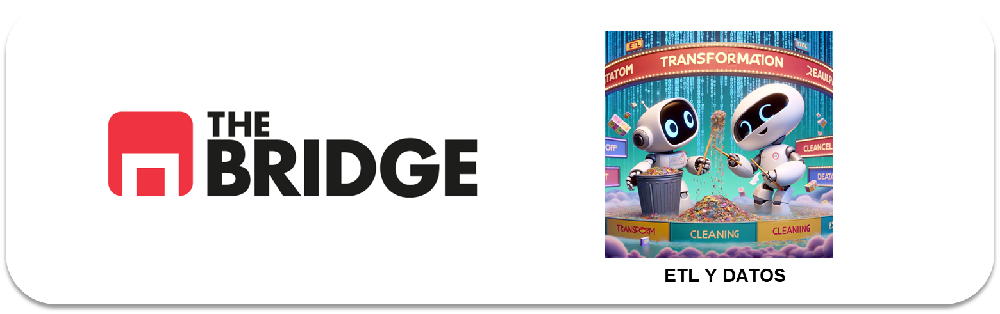

## PRACTICA OBLIGATORIA: Acceso Ficheros

* La práctica obligatoria de esta unidad consiste en varios ejercicios con tres tipos de ficheros (txt,excel y xml). Descarga este notebook en tu ordenador y trabaja en local. Ten en cuenta que tendrás que descar los directorios de imágenes y datos adicionales, si los hubiera.
* Recuerda que debes subirla a tu repositorio personal antes de la sesión en vivo para que puntúe adecuadamente.  
* Recuerda también que no es necesario que esté perfecta, sólo es necesario que se vea el esfuerzo. 
* Esta práctica se resolverá en la sesión en vivo correspondiente y la solución se publicará en el repo del curso. 

## #0 Qué fichero para qué cosa

La librería `os` proporciona una serie de funciones para trabajar con archivos y hacer operaciones del sistema operativo. Importa la librería y haz uso de la función `listdir` para poder ver los ficheros que hay en el subdirectorio `data` que acompaña a este notebook.

In [ ]:
import os

# os.listdir(directorio>) da una lista de los archivos contenidos en <directorio>
# prueba a ejecutar lo siguiente
for fichero in os.listdir("./data"):
    print(fichero)

city_sales.xlsx
mbox.txt
OptaF24.xml


1. Ahora crea una variable `fichero_texto`, otra `fichero_excel` y otra `fichero_xml` y asigna a cada una la ruta para acceder a cada tipo de fichero que te hayas encontrado en la salida del apartado anterior. Como recordarás una ruta es el camino para acceder a un fichero, en este caso incluye el path y el nombre del fichero (ojo os.listdir no te da el path, te da el nombre del fichero)

In [1]:
fichero_texto = "./data/mbox.txt"
fichero_excel = "./data/city_sales.xlsx"
fichero_xml = "./data/OptaF24.xml"

## #1 Fichero excel

Vamos a empezar trabajando con el fichero excel. 

1. Importa las librerías necesarias y carga los datos en un `DataFrame` el fichero cuya ruta has asignado a `fichero_excel`. Usa los argumentos necesarios para una correcta lectura

In [3]:
import pandas as pd

df = pd.read_excel(fichero_excel, sheet_name = 1) # No hay datos en la primera pestaña es necesario o bien abrir 
                                                    #el excel y ver cómo se llama o hacerlo posicionalmente por prueba y error 

df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,date,num,NaN,city
4,NaN,NaN,NaN,1552600.0,2016-11-16 15:13:00,3,NaN,Cambridge
...,...,...,...,...,...,...,...,...
39999,NaN,NaN,NaN,304177.0,2017-10-09 12:35:00,4,NaN,London
40000,NaN,NaN,NaN,1416565.0,2015-08-21 14:21:00,3,NaN,Cambridge
40001,NaN,NaN,NaN,1036946.0,2016-04-08 09:23:00,4,NaN,Durham
40002,NaN,NaN,NaN,228005.0,2017-01-27 13:04:00,3,NaN,London


Los datos están bastante descolocados, hay que saltarse filas y buscar los datos en columnas por rangos y separadas. Haciendo un poco de conteo: saltarse las 4 primeras filas, obtener los datos de las columnas D a F y de la H.

In [4]:
df = pd.read_excel(fichero_excel, skiprows= 4, sheet_name= 1, usecols= "D:F,H")
df

,Unnamed: 3,date,num,city
0,1552600,2016-11-16 15:13:00,3,Cambridge
1,345468,2018-02-22 13:08:00,3,London
2,1012061,2016-01-15 15:38:00,3,Durham
3,21651,2015-03-13 12:00:00,3,London
4,769095,2017-11-30 14:49:00,4,Oxford
...,...,...,...,...
39995,304177,2017-10-09 12:35:00,4,London
39996,1416565,2015-08-21 14:21:00,3,Cambridge
39997,1036946,2016-04-08 09:23:00,4,Durham
39998,228005,2017-01-27 13:04:00,3,London


2. Renombra la primera columna para que se llame "revenue" y la columna "num" por "sales"

In [18]:
# Es necesario hacer un columns para ver cómo se llaman las columnas correctamente
df.columns

Index(['Unnamed: 3', 'date', 'num', 'city'], dtype='object')

In [5]:
# Con rename
df.rename(columns= {"Unnamed: 3": "revenue","num": "sales"}, inplace = True)
df

,revenue,date,sales,city
0,1552600,2016-11-16 15:13:00,3,Cambridge
1,345468,2018-02-22 13:08:00,3,London
2,1012061,2016-01-15 15:38:00,3,Durham
3,21651,2015-03-13 12:00:00,3,London
4,769095,2017-11-30 14:49:00,4,Oxford
...,...,...,...,...
39995,304177,2017-10-09 12:35:00,4,London
39996,1416565,2015-08-21 14:21:00,3,Cambridge
39997,1036946,2016-04-08 09:23:00,4,Durham
39998,228005,2017-01-27 13:04:00,3,London


In [6]:
# cambiando el atributo directamente
df.columns = ["revenue","date","sales","city"]
df

,revenue,date,sales,city
0,1552600,2016-11-16 15:13:00,3,Cambridge
1,345468,2018-02-22 13:08:00,3,London
2,1012061,2016-01-15 15:38:00,3,Durham
3,21651,2015-03-13 12:00:00,3,London
4,769095,2017-11-30 14:49:00,4,Oxford
...,...,...,...,...
39995,304177,2017-10-09 12:35:00,4,London
39996,1416565,2015-08-21 14:21:00,3,Cambridge
39997,1036946,2016-04-08 09:23:00,4,Durham
39998,228005,2017-01-27 13:04:00,3,London


3. Muestra los tipos de datos, valores totales, etc.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   revenue  40000 non-null  int64 
 1   date     40000 non-null  object
 2   sales    40000 non-null  int64 
 3   city     40000 non-null  object
dtypes: int64(2), object(2)
memory usage: 1.2+ MB


In [8]:
df.describe()

,revenue,sales
count,4.000000e+04,40000.000000
mean,8.972235e+05,2.800325
std,5.179151e+05,0.874714
min,5.000000e+00,1.000000
25%,4.520900e+05,2.000000
50%,8.949420e+05,3.000000
75%,1.345200e+06,3.000000
max,1.795098e+06,4.000000


In [9]:
df.city.value_counts()

city
Oxford       10126
Cambridge     9971
Durham        9966
London        9937
Name: count, dtype: int64

<Axes: >

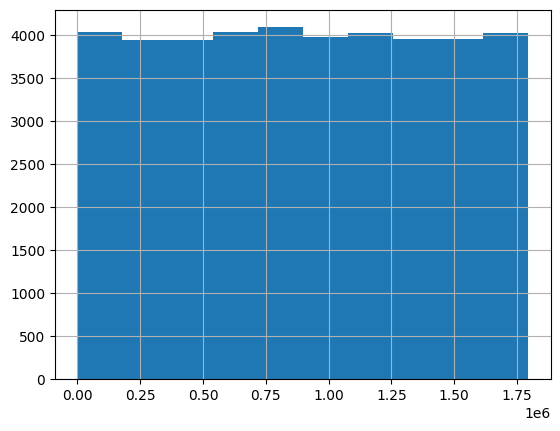

In [28]:
df.revenue.hist()

<Axes: >

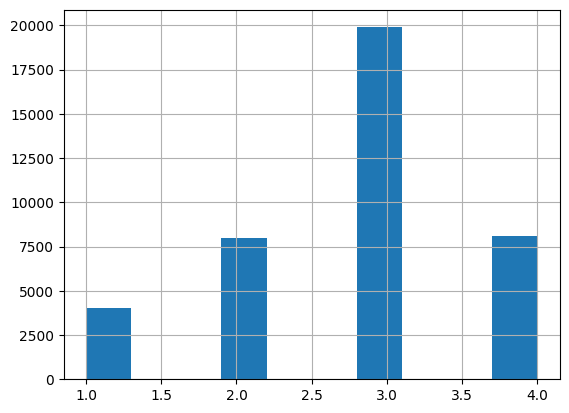

In [29]:
df.sales.hist()

4. Convierte el campo "date" a un datetime. Conviertelo en el índice del `DataFrame`

In [10]:
df["date"] = pd.to_datetime(df["date"])
df

,revenue,date,sales,city
0,1552600,2016-11-16 15:13:00,3,Cambridge
1,345468,2018-02-22 13:08:00,3,London
2,1012061,2016-01-15 15:38:00,3,Durham
3,21651,2015-03-13 12:00:00,3,London
4,769095,2017-11-30 14:49:00,4,Oxford
...,...,...,...,...
39995,304177,2017-10-09 12:35:00,4,London
39996,1416565,2015-08-21 14:21:00,3,Cambridge
39997,1036946,2016-04-08 09:23:00,4,Durham
39998,228005,2017-01-27 13:04:00,3,London


In [11]:
df.set_index("date", inplace = True)
df

,revenue,sales,city
date,,,
2016-11-16 15:13:00,1552600,3,Cambridge
2018-02-22 13:08:00,345468,3,London
2016-01-15 15:38:00,1012061,3,Durham
2015-03-13 12:00:00,21651,3,London
2017-11-30 14:49:00,769095,4,Oxford
...,...,...,...
2017-10-09 12:35:00,304177,4,London
2015-08-21 14:21:00,1416565,3,Cambridge
2016-04-08 09:23:00,1036946,4,Durham


5. Muestra las ventas agrupadas por ciudad entre 2017 y 2018 y lo mismo con los ingresos ("revenue")

In [12]:
df.loc["2017":"2018"] # Hay que ordenar el indice primero ojo


KeyError: 'Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is not allowed.'

In [13]:
df.sort_index(inplace = True)
df.loc["2017":"2018"].groupby("city").sum()

,revenue,sales
city,,
Cambridge,8263779633,13715
Durham,6000637498,13687
London,1588248522,13492
Oxford,3920841678,14229


5. Sobreescribe el fichero excel guardando el dataframe sin indice, pero sin perder la columna "date" en una hoja de nombre "clean_data"

In [14]:
df.to_excel('data/city_sales_clean.xlsx', sheet_name= "clean_data")

Abrimos el fichero con el excel y comprobamos que está todo correcto.

## #2 Texto

Vamos a leer ahora el fichero indicado en la ruta contenida en `fichero_texto`, el objetivo es procesar el contenido para construir un `DataFrame` con las siguientes columnas direcciones de correo del emisor, veredicto de si es spam o no y confidencia en ese veredicto.

1. Crea un diccionario con las siguientes claves: "from","to","is_spam","confidence" y que cada una tenga una lista vacia.

In [15]:
diccionario_spam = {
    "from": [],
    "to": [],
    "is_spam": [],
    "confidence": []
}


2. Lee el fichero (usando `with open...`) y muestra las primeras 30 filas por pantalla, así podrás ver como es más o menos la estructura del mismo

FedeErratas: Son las 60 primeras filas como mínimo

In [16]:
with open(fichero_texto) as f:
    indice = 0
    for linea in f:
        print(linea, end = "")
        indice += 1
        if indice > 60:
            break


From stephen.marquard@uct.ac.za Sat Jan  5 09:14:16 2008
Return-Path: <postmaster@collab.sakaiproject.org>
Received: from murder (mail.umich.edu [141.211.14.90])
	 by frankenstein.mail.umich.edu (Cyrus v2.3.8) with LMTPA;
	 Sat, 05 Jan 2008 09:14:16 -0500
X-Sieve: CMU Sieve 2.3
Received: from murder ([unix socket])
	 by mail.umich.edu (Cyrus v2.2.12) with LMTPA;
	 Sat, 05 Jan 2008 09:14:16 -0500
Received: from holes.mr.itd.umich.edu (holes.mr.itd.umich.edu [141.211.14.79])
	by flawless.mail.umich.edu () with ESMTP id m05EEFR1013674;
	Sat, 5 Jan 2008 09:14:15 -0500
Received: FROM paploo.uhi.ac.uk (app1.prod.collab.uhi.ac.uk [194.35.219.184])
	BY holes.mr.itd.umich.edu ID 477F90B0.2DB2F.12494 ; 
	 5 Jan 2008 09:14:10 -0500
Received: from paploo.uhi.ac.uk (localhost [127.0.0.1])
	by paploo.uhi.ac.uk (Postfix) with ESMTP id 5F919BC2F2;
	Sat,  5 Jan 2008 14:10:05 +0000 (GMT)
Message-ID: <200801051412.m05ECIaH010327@nakamura.uits.iupui.edu>
Mime-Version: 1.0
Content-Transfer-Encoding: 7bit
R

3. Ahora sabemos que el emisor viene después de "To:" el receptor después de "From:" el resultado de Spam tras "X-DSPAM-Result" y el nivel de confianza tras "X-DSPAM-Confidence", crea un programa que lea el fichero y a medida que va leyendo el texto añada cada valor (emisor, receptor, si es spam o no, nivel de confianza) a cada una de las listas del diccionario creado en 1.  
Por ejemplo, cuando llegue a una línea con "To:" que añada el correo a <diccionario>["to"]

In [70]:
# Version larga

with open(fichero_texto) as f:
    for linea in f:
        if linea.startswith("From:"):
            diccionario_spam["from"].append(linea.replace("\n","").replace("From:","").strip())
        elif linea.startswith("To:"):
            diccionario_spam["to"].append(linea.replace("\n","").replace("To:","").strip())
        elif linea.startswith("X-DSPAM-Result:"):
            resultado = linea.replace("\n","").replace("X-DSPAM-Result:","").strip()
            diccionario_spam["is_spam"].append(resultado != "Innocent")
        elif linea.startswith("X-DSPAM-Confidence:"):
            confianza = float(linea.replace("\n","").replace("X-DSPAM-Confidence:","").strip())
            diccionario_spam["confidence"].append(confianza)
            


In [79]:
# Version corta
import re
claves = {
    "From:": "from",
    "To:": "to",
    "X-DSPAM-Confidence:": "confidence",
    "X-DSPAM-Result:": "is_spam"
}
with open(fichero_texto) as f:
    for linea in f:
        parser = re.match("(From:|To:|X-DSPAM-Result:|X-DSPAM-Confidence:)(.+)", linea)
        if parser:
            diccionario_spam[claves[parser.group(1)]].append(parser.group(2) if "Result" not in parser.group(1) else parser.group(2) == "Inocent")


4. Recorre el diccionario y muestra el número de valores de cada lista (no los valores, ojo). Es para que compruebes que todos tienen la misma longitud

In [80]:
for clave,valor in diccionario_spam.items():
    print(f"clave: {clave}, tienen {len(valor)} elementos")
    

clave: from, tienen 27 elementos
clave: to, tienen 27 elementos
clave: is_spam, tienen 27 elementos
clave: confidence, tienen 27 elementos


Si las cuatro listas no te salen de la misma longitud, repasa el código del apartado anterior. (FedeErratas: Debería decir de la misma longitud y no, del mismo valor)

5. Ahora ya crea un dataframe a partir del diccionario y muestra si hay algún correo declarado como spam y la confianza media. (quizá tengas que cambiar el tipo de la columna)

In [81]:
df = pd.DataFrame(diccionario_spam)
df



,from,to,is_spam,confidence
0,stephen.marquard@uct.ac.za,source@collab.sakaiproject.org,False,0.8475
1,louis@media.berkeley.edu,source@collab.sakaiproject.org,False,0.6178
2,zqian@umich.edu,source@collab.sakaiproject.org,False,0.6961
3,rjlowe@iupui.edu,source@collab.sakaiproject.org,False,0.7565
4,zqian@umich.edu,source@collab.sakaiproject.org,False,0.7626
5,rjlowe@iupui.edu,source@collab.sakaiproject.org,False,0.7556
6,cwen@iupui.edu,source@collab.sakaiproject.org,False,0.7002
7,cwen@iupui.edu,source@collab.sakaiproject.org,False,0.7615
8,gsilver@umich.edu,source@collab.sakaiproject.org,False,0.7601
9,gsilver@umich.edu,source@collab.sakaiproject.org,False,0.7605


In [82]:
f"Correo spam: {len(df[df.is_spam])}"

'Correo spam: 0'

In [ ]:
Si no se ha hecho antes hay que cambiar el tipo de la columna "confidence":

In [84]:
df["confidence"] = df["confidence"].astype("float")

In [86]:
df.confidence.mean().round(2)

0.75

6. Grába el dataframe en un fichero csv en la ruta "./data/spam.csv" con el "|" de separador y sin índice:

In [87]:
df.to_csv("./data/spam.csv", sep = "|", index = False)

In [88]:
# Lo comprobamos
df_check = pd.read_csv("./data/spam.csv", sep = "|")
df

,from,to,is_spam,confidence
0,stephen.marquard@uct.ac.za,source@collab.sakaiproject.org,False,0.8475
1,louis@media.berkeley.edu,source@collab.sakaiproject.org,False,0.6178
2,zqian@umich.edu,source@collab.sakaiproject.org,False,0.6961
3,rjlowe@iupui.edu,source@collab.sakaiproject.org,False,0.7565
4,zqian@umich.edu,source@collab.sakaiproject.org,False,0.7626
5,rjlowe@iupui.edu,source@collab.sakaiproject.org,False,0.7556
6,cwen@iupui.edu,source@collab.sakaiproject.org,False,0.7002
7,cwen@iupui.edu,source@collab.sakaiproject.org,False,0.7615
8,gsilver@umich.edu,source@collab.sakaiproject.org,False,0.7601
9,gsilver@umich.edu,source@collab.sakaiproject.org,False,0.7605


## #3 XML

Es hora de procesar el fichero con la ruta xml. Carga las liberias necesarias:

In [93]:
import xml.etree.ElementTree as ET

1. Lee el fichero tal y como has visto hacerlo en el workout, con la función `parse` de la libería adecuada (la que has importado en la celda superior)

In [95]:
tree = ET.parse(fichero_xml)

2. Asigna el nodo raíz a la variable `ejer_raiz` y muestra su etiqueta (y sus atributos, si es que tiene)

In [99]:
ejer_raiz = tree.getroot()
ejer_raiz.tag
if hasattr(ejer_raiz, "attrib"): # Comprobamos que exista el atributo para evitarnos error al ejecutarlo
    print(ejer_raiz.attrib)

{'timestamp': '2012-09-11T10:20:32'}


3. Muestra cuantos hijos y nietos tiene el nodo raiz y la etiqueta de cada uno:

In [106]:
tags_hijo = []
for indice,hijo in enumerate(ejer_raiz,1):
    tags_hijo.append(hijo.tag)
    tags_nieto = []
    for nieto in hijo:
        tags_nieto.append(nieto.tag)
    print(f"Nodos para hijo {indice} con etiqueta tag:{hijo.tag}")
    print("\t", len(tags_nieto),list(set(tags_nieto)))
print()

Nodos para hijo 1 con etiqueta tag:Game
	 1673 ['Event']



4. Habrás comprobado que del nodo raíz cuelgan 1672 nodos con tag "Event", encuentra uno (<nodo_raiz>.find("Event"), pero primero tendrás que encontrar un nodo raiz, pista raiz.find("Game") y de ahi...) y pinta sus atributos (FedeErratas: son 1673)


In [111]:
nodo = ejer_raiz.find("Game")
evento = nodo.find("Event")
evento.attrib


{'id': '301038339',
 'event_id': '1',
 'type_id': '34',
 'period_id': '16',
 'min': '0',
 'sec': '0',
 'team_id': '43',
 'outcome': '1',
 'x': '0.0',
 'y': '0.0',
 'timestamp': '2011-08-21T15:23:06.696',
 'last_modified': '2011-08-21T15:54:56'}

5. Recorre de nuevo los eventos y crea un dataframe con las columnas de las claves del attrib de un "Event" y como valores los valores de los atributos de los 1672 eventos que hay colgando del nodo raíz.

In [116]:
# Version larga: Quiero construir un diccionario de listas, pero primero tendré que ver que los attrib no tienen los mismo campos
eventos_data = {campo: [valor] for campo,valor in evento.attrib.items()} # Usando los atributos del evento anterior creamos un diccionario de listas para crear luego el DataFrame
for evento in nodo:
    for campo,valor in evento.attrib.items():
        if campo in 
        eventos_data[campo].append(valor)

df = pd.DataFrame(eventos_data)

KeyError: 'player_id'

In [126]:
# Visto el error anterior:
eventos_data ={}
num_eventos = 0
for evento in nodo:
    col_to_fill = list(eventos_data.keys())
    for campo,valor in evento.attrib.items():
        if campo not in eventos_data:
            eventos_data[campo] = [""] * num_eventos + [valor]
            print(campo, eventos_data[campo])
        else:
            if len(eventos_data[campo]) < num_eventos:
                eventos_data[campo] += [""] * (num_eventos - len(eventos_data[campo])) + [valor]
            else:
                eventos_data[campo].append(valor)
        if campo in col_to_fill:
            col_to_fill.remove(campo)
    for col in col_to_fill:
        eventos_data[col].append("")
    num_eventos += 1

id ['301038339']
event_id ['1']
type_id ['34']
period_id ['16']
min ['0']
sec ['0']
team_id ['43']
outcome ['1']
x ['0.0']
y ['0.0']
timestamp ['2011-08-21T15:23:06.696']
last_modified ['2011-08-21T15:54:56']
player_id ['', '', '', '', '37572']
keypass ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', ''

In [127]:
eventos_data

{'id': ['301038339',
  '1475524684',
  '2036897618',
  '336246484',
  '1372839298',
  '978322590',
  '1572252644',
  '2077205137',
  '403196518',
  '509587597',
  '1962550717',
  '1886599927',
  '604657066',
  '497476041',
  '854361320',
  '959833686',
  '1460827261',
  '834406608',
  '2031924877',
  '250341070',
  '285450208',
  '1077590418',
  '1902724460',
  '601422702',
  '388925951',
  '2091682449',
  '1539485140',
  '462919396',
  '1275093897',
  '303742790',
  '2060892907',
  '366689877',
  '2005113393',
  '1664446624',
  '2070884892',
  '1086491927',
  '939036380',
  '1469946305',
  '1461307624',
  '1589845946',
  '220466501',
  '1697913679',
  '490231060',
  '12102114',
  '1015256624',
  '295641990',
  '2144302873',
  '1967987119',
  '2022602955',
  '472177798',
  '1743092457',
  '793536122',
  '1742052007',
  '80450362',
  '314747611',
  '1298408416',
  '1595680844',
  '1299585667',
  '900496528',
  '1505032819',
  '538765048',
  '936802981',
  '182011009',
  '406961680',
  '

In [130]:
df_alt = pd.DataFrame(eventos_data)
df_alt

,id,event_id,type_id,period_id,min,sec,team_id,outcome,x,y,timestamp,last_modified,player_id,keypass,assist
0,301038339,1,34,16,0,0,43,1,0.0,0.0,2011-08-21T15:23:06.696,2011-08-21T15:54:56,,,
1,1475524684,1,34,16,0,0,30,1,0.0,0.0,2011-08-21T15:39:39.166,2011-08-21T16:06:40,,,
2,2036897618,2,32,1,0,0,30,1,0.0,0.0,2011-08-21T16:00:38.967,2011-08-21T16:00:39,,,
3,336246484,2,32,1,0,0,43,1,0.0,0.0,2011-08-21T16:00:39.132,2011-08-21T16:00:39,,,
4,1372839298,3,1,1,0,1,43,1,50.1,50.0,2011-08-21T16:00:40.179,2011-08-21T16:00:41,37572,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1668,942987050,943,30,2,94,5,43,1,0.0,0.0,2011-08-21T17:52:52.790,2011-08-21T17:52:58,,,
1669,806073642,743,30,14,0,0,30,1,0.0,0.0,2011-08-21T17:54:58.140,2011-08-21T17:54:58,,,
1670,2035877935,744,37,14,0,0,30,1,0.0,0.0,2011-08-21T17:54:58.140,2011-08-22T14:32:27,,,
1671,1756867526,944,30,14,0,0,43,1,0.0,0.0,2011-08-21T17:54:58.649,2011-08-21T17:54:58,,,


In [122]:
# Version corta (mucho)
df = pd.DataFrame([event.attrib for event in nodo.findall("Event")])
df



,id,event_id,type_id,period_id,min,sec,team_id,outcome,x,y,timestamp,last_modified,player_id,keypass,assist
0,301038339,1,34,16,0,0,43,1,0.0,0.0,2011-08-21T15:23:06.696,2011-08-21T15:54:56,NaN,NaN,NaN
1,1475524684,1,34,16,0,0,30,1,0.0,0.0,2011-08-21T15:39:39.166,2011-08-21T16:06:40,NaN,NaN,NaN
2,2036897618,2,32,1,0,0,30,1,0.0,0.0,2011-08-21T16:00:38.967,2011-08-21T16:00:39,NaN,NaN,NaN
3,336246484,2,32,1,0,0,43,1,0.0,0.0,2011-08-21T16:00:39.132,2011-08-21T16:00:39,NaN,NaN,NaN
4,1372839298,3,1,1,0,1,43,1,50.1,50.0,2011-08-21T16:00:40.179,2011-08-21T16:00:41,37572,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1668,942987050,943,30,2,94,5,43,1,0.0,0.0,2011-08-21T17:52:52.790,2011-08-21T17:52:58,NaN,NaN,NaN
1669,806073642,743,30,14,0,0,30,1,0.0,0.0,2011-08-21T17:54:58.140,2011-08-21T17:54:58,NaN,NaN,NaN
1670,2035877935,744,37,14,0,0,30,1,0.0,0.0,2011-08-21T17:54:58.140,2011-08-22T14:32:27,NaN,NaN,NaN
1671,1756867526,944,30,14,0,0,43,1,0.0,0.0,2011-08-21T17:54:58.649,2011-08-21T17:54:58,NaN,NaN,NaN


Podemos comprobar que no siempre es válido el camino de usar el pd.read_x de Pandas:

In [112]:
df = pd.read_xml(fichero_xml)

In [113]:
df

,id,away_team_id,away_team_name,competition_id,competition_name,game_date,home_team_id,home_team_name,matchday,period_1_start,period_2_start,season_id,season_name,Event
0,360481,43,Manchester City,8,English Barclays Premier League,2011-08-21T16:00:00,30,Bolton Wanderers,2,2011-08-21T16:00:38,2011-08-21T17:03:47,2011,Season 2011/2012,NaN


In [ ]:
Si hay tiempo:

In [117]:
with open(fichero_xml) as f:
    for indice,linea in enumerate(f):
        print(linea, end = "")
        if indice > 40:
            break

<?xml version="1.0" encoding="UTF-8"?>
<!-- Copyright 2001-2012 Opta Sportsdata Ltd. All rights reserved. -->

<!-- PRODUCTION HEADER
     produced on:        valde-jobq-a03.nexus.opta.net
     production time:    20120911T092033,103Z
     production module:  Opta::Feed::XML::Soccer::F24
-->
<Games timestamp="2012-09-11T10:20:32">
  <Game id="360481" away_team_id="43" away_team_name="Manchester City" competition_id="8" competition_name="English Barclays Premier League" game_date="2011-08-21T16:00:00" home_team_id="30" home_team_name="Bolton Wanderers" matchday="2" period_1_start="2011-08-21T16:00:38" period_2_start="2011-08-21T17:03:47" season_id="2011" season_name="Season 2011/2012">
    <Event id="301038339" event_id="1" type_id="34" period_id="16" min="0" sec="0" team_id="43" outcome="1" x="0.0" y="0.0" timestamp="2011-08-21T15:23:06.696" last_modified="2011-08-21T15:54:56">
      <Q id="2028397186" qualifier_id="130" value="4" />
      <Q id="1518776786" qualifier_id="227" value="0

In [131]:
with open(fichero_xml) as f:
    for linea in f.read():
        print(linea)

<
?
x
m
l
 
v
e
r
s
i
o
n
=
"
1
.
0
"
 
e
n
c
o
d
i
n
g
=
"
U
T
F
-
8
"
?
>


<
!
-
-
 
C
o
p
y
r
i
g
h
t
 
2
0
0
1
-
2
0
1
2
 
O
p
t
a
 
S
p
o
r
t
s
d
a
t
a
 
L
t
d
.
 
A
l
l
 
r
i
g
h
t
s
 
r
e
s
e
r
v
e
d
.
 
-
-
>




<
!
-
-
 
P
R
O
D
U
C
T
I
O
N
 
H
E
A
D
E
R


 
 
 
 
 
p
r
o
d
u
c
e
d
 
o
n
:
 
 
 
 
 
 
 
 
v
a
l
d
e
-
j
o
b
q
-
a
0
3
.
n
e
x
u
s
.
o
p
t
a
.
n
e
t


 
 
 
 
 
p
r
o
d
u
c
t
i
o
n
 
t
i
m
e
:
 
 
 
 
2
0
1
2
0
9
1
1
T
0
9
2
0
3
3
,
1
0
3
Z


 
 
 
 
 
p
r
o
d
u
c
t
i
o
n
 
m
o
d
u
l
e
:
 
 
O
p
t
a
:
:
F
e
e
d
:
:
X
M
L
:
:
S
o
c
c
e
r
:
:
F
2
4


-
-
>


<
G
a
m
e
s
 
t
i
m
e
s
t
a
m
p
=
"
2
0
1
2
-
0
9
-
1
1
T
1
0
:
2
0
:
3
2
"
>


 
 
<
G
a
m
e
 
i
d
=
"
3
6
0
4
8
1
"
 
a
w
a
y
_
t
e
a
m
_
i
d
=
"
4
3
"
 
a
w
a
y
_
t
e
a
m
_
n
a
m
e
=
"
M
a
n
c
h
e
s
t
e
r
 
C
i
t
y
"
 
c
o
m
p
e
t
i
t
i
o
n
_
i
d
=
"
8
"
 
c
o
m
p
e
t
i
t
i
o
n
_
n
a
m
e
=
"
E
n
g
l
i
s
h
 
B
a
r
c
l
a
y
s
 
P
r
e
m
i
e
r
 
L
e
a
g
u
e
"
 
g
a
m
e
_
d
a
t
e
=
"
2
0
1
1
-
0
8
-
2
1
T
1
6
:
0
